In [ ]:
import importlib
import seaborn as sns
import matplotlib.pyplot as plt
import src.models.MobileNet.runner_scripts.trainer as trainer
import src.models.MobileNet.classifier as classifier
import src.models.MobileNet.data_loader as data_loader
import src.models.MobileNet.metrics as metrics
import os
import Notebooks.utils.utils as utils
import Notebooks.utils.error_analysis as error_analysis
import pandas as pd
from IPython.core.display import display, HTML
from PIL import Image
from IPython.display import display, Image as IPImage
from matplotlib.image import imread
import numpy as np
import torch
import src.models.MobileNet.data_defs as data_defs
import src.models.MobileNet.metrics as metrics
import warnings

In [3]:
utils.fix_cwd()
sns.set_theme(style="darkgrid", palette="pastel")
plt.style.use("fivethirtyeight")

VERBOSE = True

### 3.0. Performance Analysis

In this notebook, we'll evaluate two versions of our final production model:

1. `v1/baseline` - tuned to minimize overall loss (a combined normalized loss for `gender` and `age` prediction) while maximizing `gender` prediction accuracy and minimizing `age` MAE (mean absolute error).

2. `v2/improved` - This model was developed based on the error and misclassification analysis of `v1`. Specifically, we examined:
   - Performance across different bins of age, luminance (as a heuristic for skin color), image quality, and other factors
   - Individual sample analysis using LIME (Local Interpretable Model-agnostic Explanations)

   Based on this, we selected appropriate oversampling techniques, augmentations, and transforms to improve performance across these groups, particularly focusing on areas where the baseline model showed weaknesses.

The notebook is structured in an iterative way i.e. in the first part we only analyze the `v1` model and explain how those insights were used to build the `v2` model (this was done before training/evaluating the improved model) 

#### 3.1. V1/baseline Summary


 
After ~150-200 total runs (see the hyperparemter tuning notebook for details) We've selected this configuration:

| Parameter                      | Value                                       |
|--------------------------------|---------------------------------------------|
| anneal_strategy                | "cos"                                       |
| base_lr                        | 0.0068893981577029285                       |
| batch_size                     | 256                                         |
| div_factor                     | 24                                          |
| dropout                        | 0.1                                         |
| final_div_factor               | 2,873                                       |
| freeze_epochs                  | 0                                           |
| gender_loss_weight             | 0.9                                         |
| l1_lambda                      | 0.0001                                      |
| lr_scheduler                   | "one_cycle"                                 |
| max_lr                         | 0.012321315111072404                        |
| model_type                     | "mobilenet_v3_small"                        |
| num_epochs                     | 18                                          |
| override_cycle_epoch_count     | 15                                          |
| pct_start                      | 0.36685557351085574                         |
| prefix                         | "fixed_samples_final_full_split_15_cycle+3" |
| train_path                     | "dataset/train_8_folds_first"               |
| use_dynamic_augmentation       | false                                       |
| val_path                       | "dataset/test_2_folds_last"                 |
| weight_decay                   | 0.00019323262043373016                      |

Main parameters:

- `OneCycle` with `Cosine Annealing`  achieved considerably faster convergence and better generalization. Only 15-20 epochs with 256 batch size were needed to achieve optimal performance compared to step, decay or reduce on plateau schedulers (25-35+ epochs).

- AdamW was used as an optimizer.

- In addition, we've used L1 regularization (AdamW already has L2  builtin) and dropout (only applied to our final classifier/regression layers) to reduce overfitting. We've observed a relative small impact on validation/training performance with the UTK dataset however it theoretically have a bigger impact in real-world/production data.

In [4]:
%%html
<iframe src="https://wandb.ai/qqwy/ag_classifier_main/reports/Best-Iteration-1-model-graceful-hill-257---Vmlldzo4ODIwODg5" style="border:none;height:1024px;width:100%">

In [6]:
data = {
    "Parameter": [
        "model_type",
        "lr_scheduler",
        "anneal_strategy",
        "base_lr",
        "batch_size",
        "div_factor",
        "dropout",
        "final_div_factor",
        "freeze_epochs",
        "l1_lambda",
        "max_lr",
        "num_epochs",
        "override_cycle_epoch_count",
        "weight_decay",
        "pct_start",
        "train_path",
        "val_path",
    ],
    "Value": [
        "mobilenet_v3_small",
        "one_cycle",
        "cos",
        0.0068893981577029285,
        256,
        24,
        0.1,
        2873,
        0,
        0.0001,
        0.012321315111072404,
        18,
        15,
        0.00019323262043373016,
        0.36685557351085574,
        "dataset/train_8_folds_first",
        "dataset/test_2_folds_last",
    ],
};

''

##### 3.1.1. Main Observations

- using `one_cycle` as our LR scheduler has allowed us to achieve convergence in only ~15 epochs while providing significantly better performance than `reduce_on_plateau` or `step_lr` were able to achieve even after 30-40 epochs.

- `freeze_epochs` training only the new (`age`/`gender`) classifier heads had relatively limited impact. Gennerally freezing for  1 to 3 it achieved slightly lower age MAE at the cost of reduced gender accuracy.

- MobileNet was fine-tuned using pretrained weights (`IMAGENET1K_V1`). We've found that training MobileNet from scratch (using randomized initial weights) can provide comparable or only slightly inferior performance with the UTK dataset. We've still chosen to use the pretrained weights because:
    - the model still performs a bit better (0.015 higher accuracy, ~0.2 lower MAE)
    - because the model was trained with a higher variety of images in different condition the model should still perform better (or not worse) on images of faces in real-world conditions.

In [11]:
BASE_MODEL_NAME = "final_prod_z5yxudkl_graceful-hill-257_19_0.9310.pth"
OVERSAMPLE_AUG_MODEL_NAME = "full_aug_small_production_v1.pth"
NOT_PRETRAINED_MODEL_NAME = (
    "NO_WEIGHTS_full_dynamic_aug_tune_18_cycle+3_sage-planet-309_20_0.9259.pth"
)

In [12]:
test_config = {
    "ds_path": "dataset/test_2_folds_last",
    "batch_size": 512,
}

In [ ]:
base_model = trainer.load_model(BASE_MODEL_NAME)
base_model.eval()
improved_model = trainer.load_model(OVERSAMPLE_AUG_MODEL_NAME)
improved_model.eval()

In [ ]:
data_module_base = data_loader.create_dataloaders(test_config, mode="test")
data_module_base.setup("test")
predictions_base = classifier.predict_with_model(base_model, data_module_base);

In [ ]:
data_module_improved = data_loader.create_dataloaders(test_config, mode="test")
data_module_improved.setup("test")
predictions_improved = classifier.predict_with_model(
    improved_model, data_module_improved
)

In [ ]:
importlib.reload(error_analysis)

image_data_path = "dataset/image_entropy_summary.csv"
image_data = pd.read_csv(image_data_path)

merged_data_base = error_analysis.sync_predictions_with_image_data(
    predictions_base, image_data
)
merged_data_improved = error_analysis.sync_predictions_with_image_data(
    predictions_improved, image_data
)


image_quality_metrics_base = error_analysis.evaluate_by_image_quality(merged_data_base)
image_quality_metrics_improved = error_analysis.evaluate_by_image_quality(
    merged_data_improved
);

#### 3.2.0  Performance Metrics

###### 3.2.1. Gender (binary classifier):

In [17]:
importlib.reload(metrics)
evaluation_results_improved = metrics.evaluate_predictions(predictions_improved)

evaluation_results_base = metrics.evaluate_predictions(predictions_base)
evaluation_results_base[("gender_metrics")]

,Female,Male,Overall
Support,2353.000000,2387.000000,4740.000000
Accuracy,0.931013,0.931013,0.931013
Precision,0.924204,0.937925,0.931065
Recall,0.937952,0.924173,0.931062
F1-score,0.931027,0.930998,0.931013
AUC-ROC,NaN,NaN,0.980522
PR-AUC,NaN,NaN,0.977997
Log Loss,NaN,NaN,0.178862


###### Age estimation:

In [18]:
evaluation_results_base["age_metrics"]

,Value
MAE,5.105901
MSE,54.144762
RMSE,7.358312
R-squared,0.862191
MAPE,25.161557


The initial `v1` model was able to achieve an accuracy of ~93% for gender predictions and Age MAE (Mean Absolute Error) of around 5.1 years. Which is reasonably good compared to the baseline performance of some significantly more complex models like VGG:

In [19]:
utils.get_baselines_table()

,Model,Age Estimation (MAE),Gender Classification (Accuracy)
0,XGBoost (+feat. extraction),5.89,93.80
1,SVC(..),5.49,94.64
2,VGG_f,4.86,93.42
3,ResNet50_f,4.65,94.64
4,SENet50_f,4.58,94.90


(*https://arxiv.org/pdf/2110.12633)

In [20]:
importlib.reload(utils)
utils.model_desc_table()

,VGG16,ResNet50,MobileNetV3-Small
Metric,,,
Parameter Count,~138 million,~25.6 million,~2.5 million
"Model Size (PyTorch, FP32)",~528 MB,~98 MB,~10 MB
Inference Speed (relative),1x (baseline),~2.5x faster,~10x faster
FLOPs,~15.5 billion,~4.1 billion,~56 million
Approx. Memory Usage (inference),1x,~0.6x,~0.15x



Being able to achieve this with a much smaller and less complex model is not necessarily particularly exceptional, the UTK Face dataset is relatively small and specific compared to general image classification tasks (which effectively can level the playing field for smaller models) and there are several other studies/benchmarks showing  that show MobileNet variants performing competitively with larger models on simple task like this (while performing signficantly worse at more compelx tasks like emotion detecting or face recognition):

`e.g. according to  Savchenko, A. V. (2024). arXiv. https://ar5iv.labs.arxiv.org/html/2103.17107
MobileNet without any fine-tuning using the UTKFace dataset (i.e. and full UTKFace  was used for testing) actually outperformed VGG-16 & ResNet-50.`

###### Summary of Age Prediction:

The age predictions are slightly underestimated and biased toward younger ages:

In [21]:
evaluation_results_base["age_statistics"]

,True Age,Predicted Age
Mean,33.308439,32.147823
Median,29.000000,28.514690
Min,1.000000,-2.139822
Max,116.000000,95.214233


###### Summary of Gender Prediction:

The model exhibits a minor bias towards female predictions despite a slightly male-skewed test sample:

<Axes: title={'center': 'Gender Classification'}, xlabel='Predicted label', ylabel='True label'>

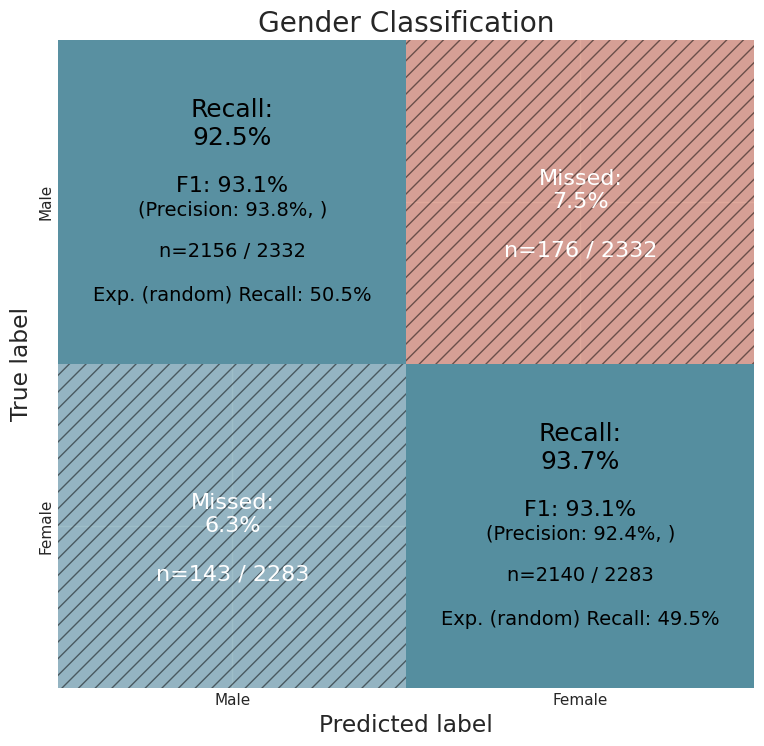

In [90]:
importlib.reload(error_analysis)

error_analysis.confusion_matrix_plot_v2(
    merged_data_base,
    "true_gender",
    "gender_pred",
    title="Gender Classification",
    class_labels=["Male", "Female"],
)

#### 3.2.2.  Performance by Binned Luminance (proxy for skin color)

Based on what've we've discussed previously we'll try to use image luminance to measure any biases our model might have related to skin color (i.e. if it performs better/worse depending if the subject skin color is darker/brighter).

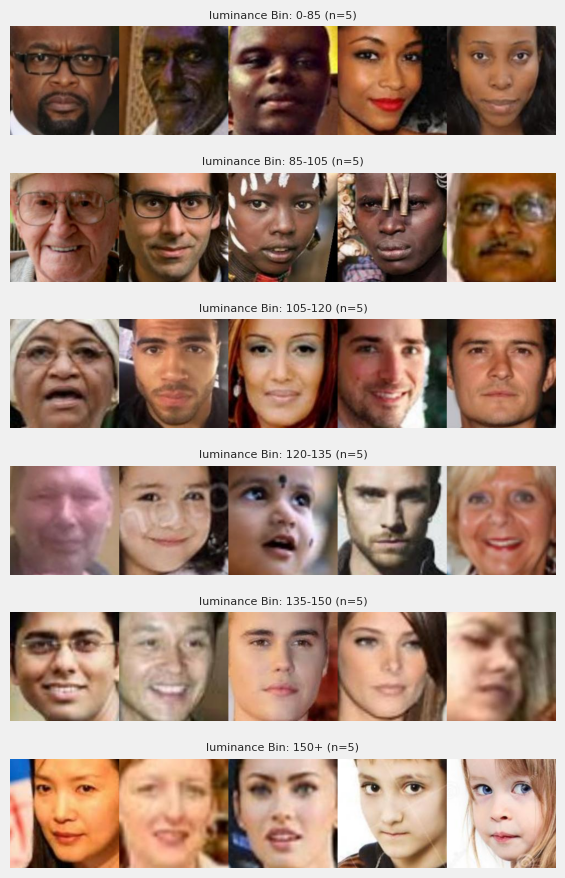

In [119]:
importlib.reload(metrics)
metrics.display_binned_samples(merged_data_base)

Looking at gender prediction accuracy we can see that the model performs more or less comparably on images that are average or darker than average however luminance increases the performance goes down. This is likely because pictures of children and babies are overrepresented in the higher luminance bins (a higher proportion of the were taken under bright studio lighting):


In [59]:
importlib.reload(metrics)

vars_to_bin = [
    ("luminance", metrics.DEFAULT_LUMINANCE_BINS),
    ("brisque_score", metrics.DEFAULT_BRISQUE_BINS),
]

t = metrics.calculate_binned_metrics(merged_data_base, ["gender", "age"], vars_to_bin)
lum_bins_improved = metrics.calculate_binned_metrics(
    merged_data_improved, ["gender", "age"], vars_to_bin
)

lum_bins_base = t
lum_bins_base["gender"]["luminance_binned"]

,sample_size,mean gender (std),mean age (std),accuracy,F1,log_loss
bin,,,,,,
0-85,412,0.45(0.50),33.76(14.57),0.951,0.947,0.156
85-105,748,0.49(0.50),34.72(17.91),0.934,0.933,0.188
105-120,846,0.51(0.50),34.84(18.00),0.937,0.939,0.151
120-135,892,0.49(0.50),34.84(18.54),0.959,0.958,0.142
135-150,805,0.51(0.50),34.03(21.26),0.911,0.911,0.179
150+,912,0.50(0.50),28.26(23.62),0.904,0.905,0.227



There seems to be a lot of variance between bins when predicting age. It's hard to explain for first 4 bins since they have comparable actual average age (MAE goes down due to mathematical reasons as age decreases should we should ignore the last bin)


In [67]:
lum_bins_base["age"]["luminance_binned"]

,sample_size,MAE,RMSE
bin,,,
0-85,412,5.408,8.055
85-105,748,5.407,7.859
105-120,846,4.997,7.161
120-135,892,5.616,7.921
135-150,805,5.037,7.057
150+,912,4.459,6.540


#### 3.2.3. Accuracy of Gender Prediction by Age Group


In [16]:
evaluation_results_base["gender_accuracy_by_age"]

,Total,Correct,Accuracy
Age_Group,,,
0-4,444,307,0.6914
4-14,261,215,0.8238
14-24,636,604,0.9497
24-30,1228,1187,0.9666
30-40,865,837,0.9676
40-50,399,393,0.9850
50-60,420,409,0.9738
60-70,229,218,0.9520
70-80,156,149,0.9551


We can see that gender prediction accuracy is reasonably high across all ranges except young children. Realistically it's unlikely we can do anything about that, facial features of babies tend to be very different from adults. Potentially it might be worth investigating building a separate model for them but it's unlikely that it would achieved very high performance either.


#### 3.2.4. Age Prediction by Age Group

In [18]:
importlib.reload(metrics)
evaluation_results_base["performance_by_age_bin"]

,Age_Group,Support,Age_MAE,Age_MSE,Age_RMSE,Age_R-squared,Age_MAPE
0,0-4,444,1.588580,11.325658,3.365361,-9.241579,99.745904
1,4-14,261,4.011655,34.033093,5.833789,-3.743251,46.700869
2,14-24,636,4.171022,32.965802,5.741585,-2.937213,21.156784
3,24-30,1228,3.720786,30.006521,5.477821,-10.167695,13.674633
4,30-40,865,6.270144,63.924114,7.995256,-7.162335,17.644973
5,40-50,399,7.749943,96.742555,9.835779,-10.194667,16.942367
6,50-60,420,7.311122,91.486462,9.564856,-11.248783,13.271226
7,60-70,229,6.725516,80.393407,8.966237,-8.236708,10.369088
8,70-80,156,7.617475,105.892985,10.290432,-11.530508,10.082188
9,80+,102,8.947648,173.258202,13.162758,-3.118748,9.777900


This table shows one of the flaws of using MAE are our target metric, it downplays inaccurate predictions for children and potential exaggerates them as the subject age increases.

i.e.  miss-classifying a newborn as a 5-year-old child or the other way around is much bigger error than doing the same when the subject is over 70. 

MAPE (Mean Absolute Percentage Error) would pontetially be a better metric, however it  can (and clearly is) be problematic for very young ages (near zero) as it leads to extremely large or undefined percentages.

However, the fact  that `MAE` for samples with subject that are between ~50-70 or so (`80+` bin mainly contains outliers which are hard to estimate correctly) should be significantly lower than for subjects in their 20s to 40s. This is likely an outcome of images in the 20-30 bin being highly overrepresented in the dataset.

To visualize this result we've converted the continious `age` variable into a binned multiclass target:


<Axes: title={'center': 'Accuracy of Binned Age Prediction'}, xlabel='Predicted label', ylabel='True label'>

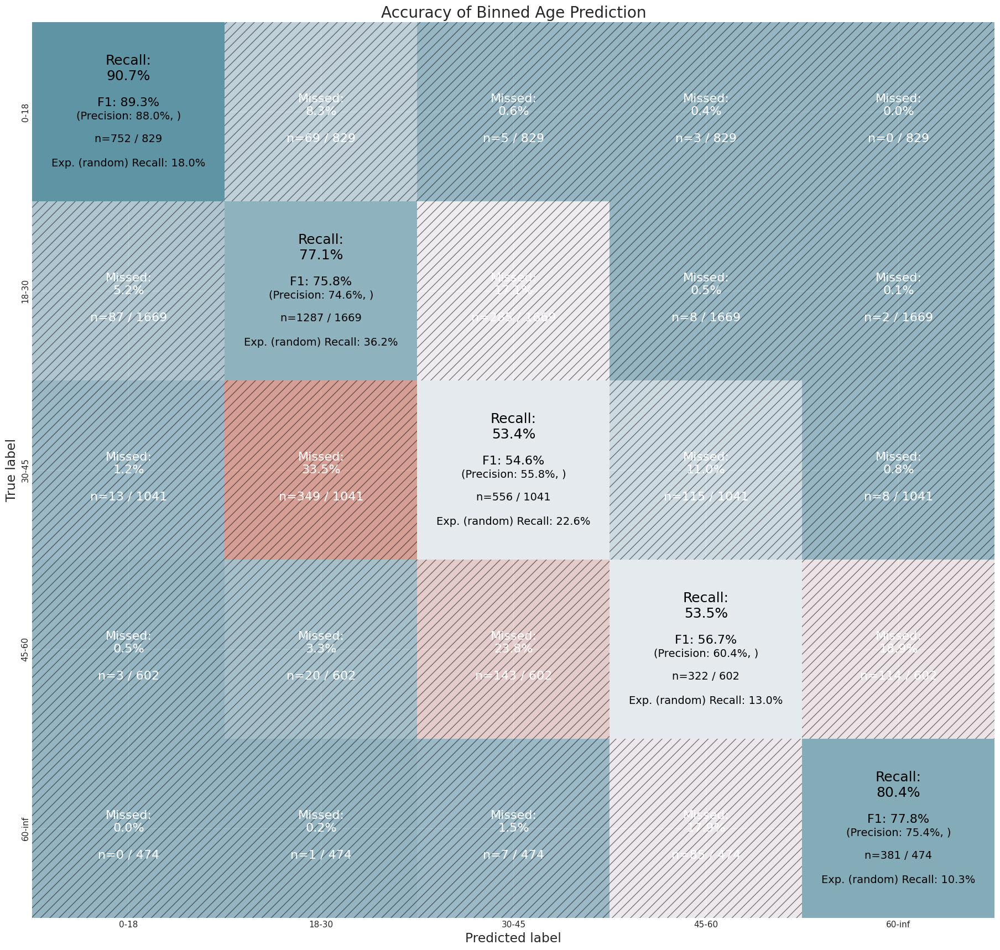

In [93]:
def process_age_groups(df, true_col, pred_col):
    age_groups = sorted(df[true_col].unique())
    ranges = [
        (
            float(g.split("-")[0]),
            float("inf") if g.endswith("inf") else float(g.split("-")[1]),
        )
        for g in age_groups
    ]

    df["true_group_index"] = (
        pd.Categorical(df[true_col], categories=age_groups).codes
    ).astype(int)
    df["pred_group_index"] = pd.cut(
        df[pred_col].map(lambda x: max(x, 0.01)),
        bins=[r[0] for r in ranges] + [float("inf")],
        labels=False,
    ).astype(int)

    return df, age_groups


df, class_labels = process_age_groups(merged_data_base, "age_group", "age_pred")

importlib.reload(error_analysis)
error_analysis.confusion_matrix_plot_v2(
    df,
    "true_group_index",
    "pred_group_index",
    class_labels=class_labels,
    title="Accuracy of Binned Age Prediction",
)

In [23]:
merged_data_base["brisque_score"].describe()

DEFAULT_BRISQUE_BINS = [-np.inf, 25, 33, 41, np.inf]

#### 3.2.5. Age/Gender Accuracy Relative to Image Quality

We'll evaluate our model's performance across different quality images (using BRISQU) similarly to how we did this for luminance:

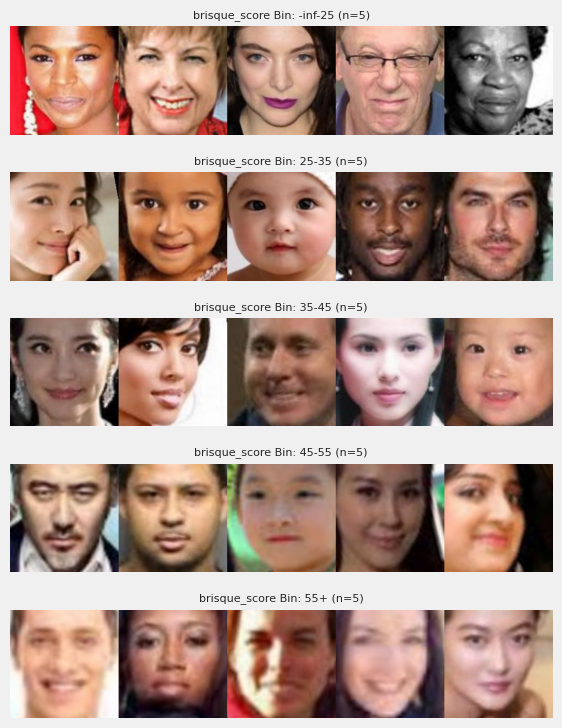

In [147]:
importlib.reload(metrics)
metrics.display_binned_samples(
    merged_data_base, column_to_bin="brisque_score", bins=metrics.DEFAULT_BRISQUE_BINS
)

In [148]:
t["gender"]["brisque_score_binned"]

,sample_size,mean gender (std),mean age (std),accuracy,F1,log_loss
bin,,,,,,
-inf-25,1125,0.51(0.50),37.86(24.56),0.938,0.940,0.158
25-35,1457,0.48(0.50),33.14(18.53),0.933,0.930,0.170
35-45,1201,0.49(0.50),30.78(17.09),0.930,0.929,0.177
45-55,597,0.50(0.50),31.08(17.19),0.926,0.928,0.190
55+,235,0.54(0.50),30.61(16.99),0.898,0.905,0.255


In [149]:
t["age"]["brisque_score_binned"]

,sample_size,MAE,RMSE
bin,,,
-inf-25,1125,5.324,7.454
25-35,1457,4.876,6.761
35-45,1201,4.874,7.078
45-55,597,5.524,8.368
55+,235,5.899,9.296


Interestingly enough while our model does struggle predicting gender when the image quality is low, this again isn't as clear-cut noticeable for age.

However, if we exclude the first bin (signficantly higher average age) we can see a similar trend as with age.

##### 3.2.6. More Detailed Age Prediction Plots

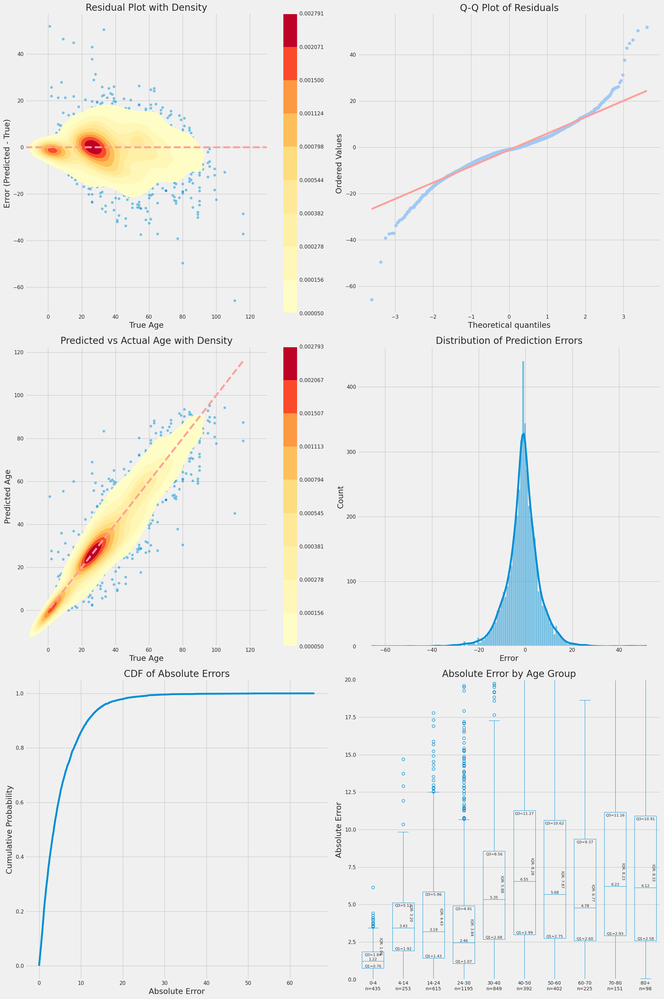

In [26]:
importlib.reload(error_analysis)
warnings.filterwarnings("ignore")

error_analysis.evaluate_age_prediction(
    merged_data_base["true_age"],
    merged_data_base["age_pred"],
    bins=metrics.DEFAULT_AGE_BINS,
)

Some additional visualizing the model's performance when predicting age. Main points to note:

- MAE might not be the ideal primary metric because it significantly overestimates the model's performance for lower age groups (i.e. telling a part 0 and 2-year-old child is much easier than somebody who is 65 and 70)

- The model is slightly biased to underpredict age (i.e. mean real age = 33.31, predicted = 32.15) as the distribution of errors is slightly shifted to the left.


##### 3.2.7. Analysing Individual Predictions with LIME

<module 'Notebooks.utils.error_analysis' from '/mnt/v/projects/DL_s3/Notebooks/utils/error_analysis.py'>

In [27]:
image_files = [
    "dataset/full/3_1_0_20170109193055962.jpg.chip.jpg",
    "dataset/full/15_0_0_20170104012346994.jpg.chip.jpg",
    "dataset/full/17_1_0_20170109214008165.jpg.chip.jpg",
    "dataset/full/31_1_4_20170117203039631.jpg.chip.jpg",
    "dataset/full/40_0_0_20170117151450653.jpg.chip.jpg",
    "dataset/full/50_0_0_20170111181750459.jpg.chip.jpg",
    "dataset/full/79_0_0_20170111222432817.jpg.chip.jpg",
    "dataset/full/110_0_0_20170112213500903.jpg.chip.jpg",
]

test_set = error_analysis.process_images(base_model, image_files)

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

We've selected some images across the entire age range  semi-randomly, the plots show which parts of the image the model is estimated to use to decide the predicted age/gender.

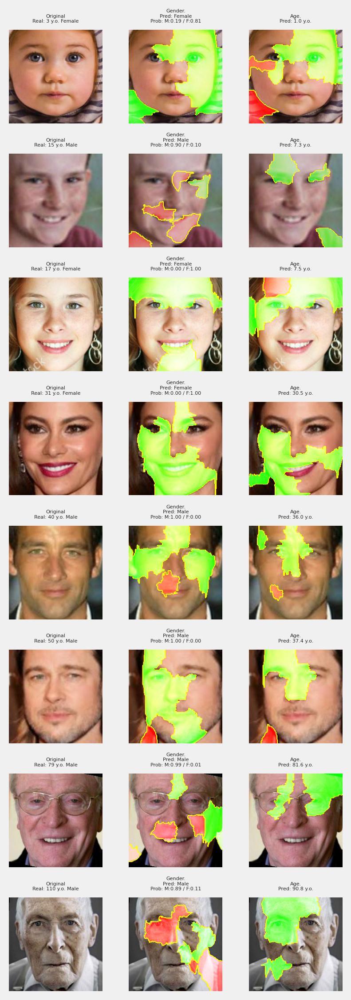

Figure size: 840x2240 px


In [28]:
importlib.reload(error_analysis)
error_analysis.display_grid(test_set, scale=0.35)

In a way this highlights some inherent flaws in using photographs to estimate age, it highly depends on the subjects themselves i.e. we can gennerally expected that some individuals like actors and other celebrities would appear younger than random individuals of the same age.

In [29]:
importlib.reload(error_analysis)
misclassified_files = error_analysis.get_misclassified_from_predictions(
    predictions_base, data_module_base, test_config, n=8
)

In [153]:
results_combined = error_analysis.process_images(
    base_model, misclassified_files.combined[:5]
)
results_age = error_analysis.process_images(
    base_model,
    [p for p in misclassified_files.age if not p in misclassified_files.combined],
)
results_gender = error_analysis.process_images(
    base_model,
    [p for p in misclassified_files.gender if not p in misclassified_files.combined],
)

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

##### Most Misclassified Images (both gender/age)

We also looked at the samples the model struggled the most with (i.e. the difference between real and estimated age and the predicted gender prob. and the actual gender was the highest:

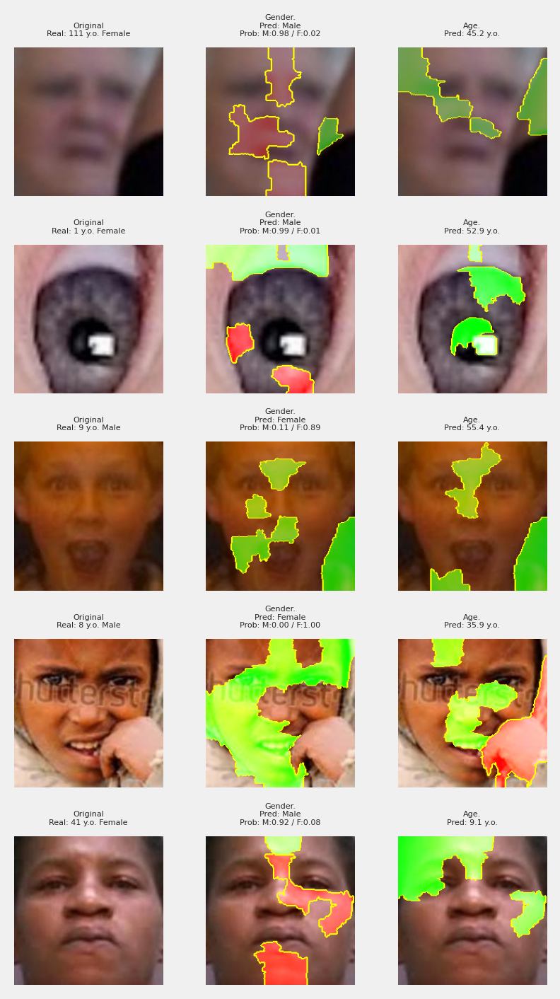

Figure size: 840x1400 px


In [154]:
importlib.reload(error_analysis)
error_analysis.display_grid(results_combined)

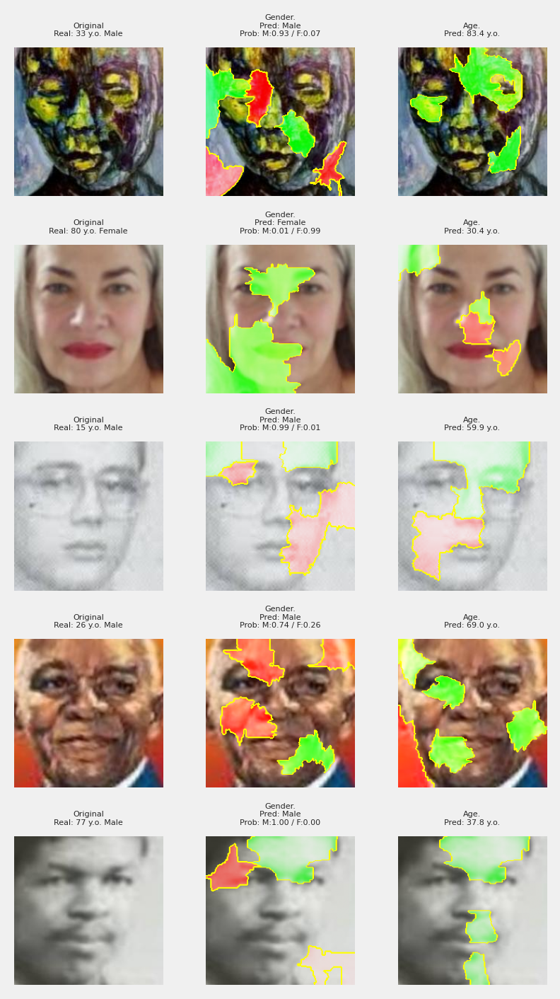

Figure size: 840x1400 px


In [155]:
error_analysis.display_grid(results_age)

Some of the results  are probably unavoidable due to flaws of the samples themselves (i.e. low quality images or drawing/paintings rather that actual photographs. One way to tackle would be by using some additional models/heuristics to simply exclude these samples from the train/test sets.

###### Misclassified Gender

Looking at gender specifically it's actually likely that our model performs better than the summarized results might imply.

We can see that all except one are likely cases of data being mislabeled in the original dataset (OR it's labeled accurately based on those individual's self-identity)

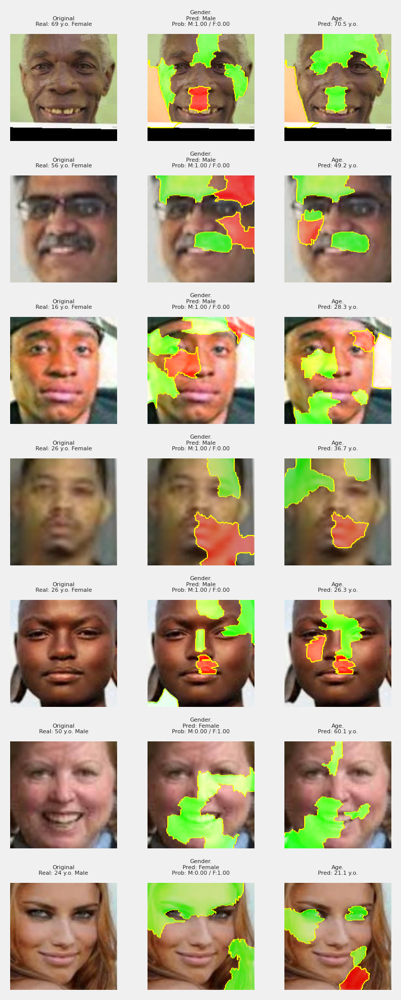

Figure size: 840x1960 px


In [156]:
error_analysis.display_grid(results_gender)

We can see two main issues:

1. Some images are  poor quality or are strongly cropped.
It's possible that we can solve this problem by using heuristics in preprocessing to exclude these samples from trained and test samples.

2. We can see certain patterns related to race and age.
The model is having issue classifying face of people who are non-white, possibly due to different facial features or skin color (although grayscale transform should partially fix that).
Also, it's struggling with either very old people or children/babies possibly because of too small sample size and relatively more "androgynous" facial features in those groups.
We'll attempt to fix this using augmentation in combination with oversampling (i.e. we'll use transforms to create additional samples for age bins which are underrepresented, additionally we'll use some of the color analysis from the EDA to  also oversample the images of under-represented skin colors)

3. Many samples are potentially mislabeled.
It's possible that some of the samples are of people who self-identify as male/female while still retaining facial features, hairstyles etc. of the opposite gender. Or they are just mislabeled. In either case this part would be the hardest to solve.

### 3.3 Building the Improved `v2` Model

#### Summary of issues with the initial model:

- Some samples appear to be mislabeled and/or don't conform with general facial attributes expected for certain genders or ages. 
    - A less biased and more ethically considerate approach would be to not treat gender as a binary target but rather a continuous scale between "feminine" and "masculine" facial features. However, we can't achieve this while using a binary-labeled dataset.
    - Additional heuristics and/or models can be used to exclude "invalid" images (i.e., those that don't contain faces, are drawings instead of photographs, etc.).

- The model is biased towards younger age groups.
- There is some variance between different types of images (e.g., luminance/skin color, certain combinations of image quality/luminance and gender, etc.).
    - This is likely due to the imbalance in the training dataset, which should be addressed by using a weighted loss function, oversampling, other techniques, and their combinations.

#### Augmentation-Based Oversampling

Instead of using a weighted loss function adjusted for  age and gender imbalance we've chosen to use augmentation based oversampling (i.e. we've used intensive transformations (as discussed in the preprocessing notebook) to generate additional samples for underrepresented age groups). We've made this decision due to these reasons:

- ***Data diversity***: Augmentation creates varied samples for underrepresented ages, improving model generalization across the age spectrum, unlike weighted loss which may overemphasize rare samples without increasing variety.
- ***Age continuity***: This method preserves the continuous nature of age, maintaining a natural distribution, whereas weighted loss might implicitly discretize age groups.
- ***Flexibility and insight***s: Allows age-specific adjustments and provides insights into effective augmentations, informing future data strategies.
- ***Versatility***: Can be applied offline, reducing training complexity, and the augmented dataset is usable with various architectures, aiding transfer learning.

##### Potential issues:

- **Artificial data introduction**: May create unrealistic samples that don't represent real-world data accurately.
- **Computational overhead**: Generating and storing augmented samples can be resource-intensive.
- **Overfitting risk**: Excessive augmentation might lead to overfitting on artificial patterns.
- **Tuning complexity**: Finding the right balance of augmentations and oversampling ratios is quite challenging.
- **Uneven effectiveness**: May not work equally well for all types of imbalances or data characteristics.
- **Augmentation bias**: Certain augmentations may inadvertently introduce or amplify biases.
- **Validation challenges**: Difficulties in assessing the quality and realism of augmented samples.




##### Original vs Augmented Training Samples

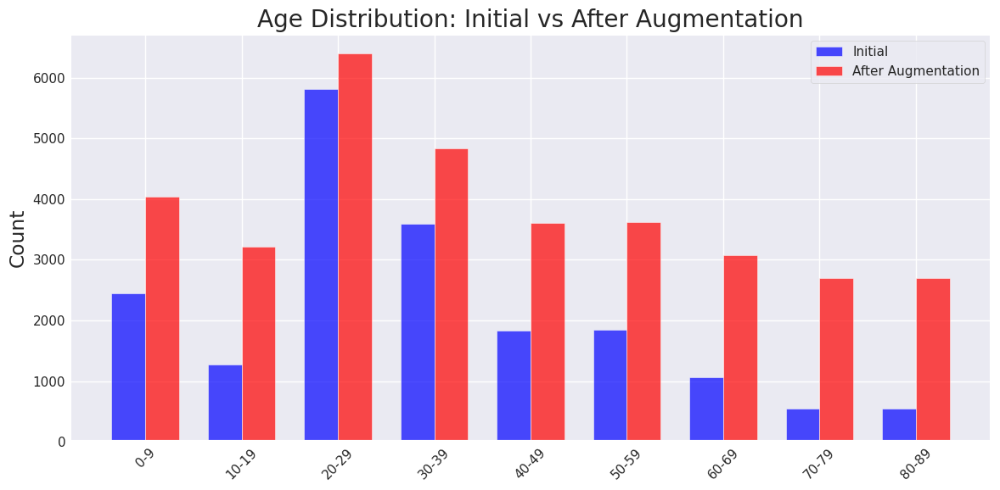

In [56]:
sampling_data = {
    "Age_Group": [
        "0-9",
        "10-19",
        "20-29",
        "30-39",
        "40-49",
        "50-59",
        "60-69",
        "70-79",
        "80-89",
    ],
    "Initial": [2452, 1268, 5816, 3586, 1837, 1845, 1068, 543, 541],
    "After Augmentation": [4042, 3213, 6397, 4836, 3611, 3617, 3073, 2705, 2704],
}

sampling_data_df = pd.DataFrame(sampling_data)
sampling_data_df["Sample_Size_Change"] = (
    (sampling_data_df["After Augmentation"] - sampling_data_df["Initial"])
    / sampling_data_df["Initial"]
    * 100
)

fig, ax = plt.subplots(figsize=(12, 6))

x = range(len(sampling_data_df["Age_Group"]))
width = 0.35

ax.bar(
    [i - width / 2 for i in x],
    sampling_data_df["Initial"],
    width,
    label="Initial",
    color="blue",
    alpha=0.7,
)
ax.bar(
    [i + width / 2 for i in x],
    sampling_data_df["After Augmentation"],
    width,
    label="After Augmentation",
    color="red",
    alpha=0.7,
)

ax.set_ylabel("Count")
ax.set_title("Age Distribution: Initial vs After Augmentation")
ax.set_xticks(x)
ax.set_xticklabels(sampling_data_df["Age_Group"], rotation=45)
ax.legend()

plt.tight_layout()
plt.show()

Instead of equalizing the size of all age bins we've experimented to with various different multipliers during  hyperparameter tuning. We've chosen this approach to avoid introducing an overly high number of augmented images to minimize the aforementioned risks of introducting artificial biases and patterns that would disprotionally affect the underrepresented groups. 

### Comparing Both Models


In [189]:
combined_df = pd.DataFrame(
    {
        "v1 Overall": evaluation_results_base["gender_metrics"]["Overall"],
        "v2 Overall": evaluation_results_improved["gender_metrics"]["Overall"],
    }
)

combined_df["Improvement"] = combined_df["v2 Overall"] - combined_df["v1 Overall"]
combined_df["% Improvement"] = (
    combined_df["Improvement"] / combined_df["v1 Overall"]
) * 100
combined_df["% Improvement"] = combined_df["% Improvement"].apply(lambda x: f"{x:.2f}%")

combined_df.rename(columns={"index": "Metric"}, inplace=True)
combined_df

,v1 Overall,v2 Overall,Improvement,% Improvement
Support,4740.000000,4740.000000,0.000000,0.00%
Accuracy,0.931013,0.938608,0.007595,0.82%
Precision,0.931065,0.938621,0.007556,0.81%
Recall,0.931062,0.938591,0.007529,0.81%
F1-score,0.931013,0.938603,0.007590,0.82%
AUC-ROC,0.980522,0.981255,0.000733,0.07%
PR-AUC,0.977997,0.976712,-0.001285,-0.13%
Log Loss,0.178862,0.192300,0.013438,7.51%


In [188]:
combined_df = pd.DataFrame(
    {
        "v1": evaluation_results_base["age_metrics"]["Value"],
        "v2": evaluation_results_improved["age_metrics"]["Value"],
    }
)

combined_df["Improvement"] = combined_df["v2"] - combined_df["v1"]
combined_df["% Improvement"] = (combined_df["Improvement"] / combined_df["v1"]) * 100
combined_df["% Improvement"] = combined_df["% Improvement"].apply(lambda x: f"{x:.2f}%")

combined_df.rename(columns={"index": "Metric"}, inplace=True)
combined_df

,v1,v2,Improvement,% Improvement
MAE,5.105901,4.730945,-0.374956,-7.34%
MSE,54.144762,48.337331,-5.807431,-10.73%
RMSE,7.358312,6.952505,-0.405807,-5.51%
R-squared,0.862191,0.876972,0.014781,1.71%
MAPE,25.161557,20.222332,-4.939225,-19.63%


In [74]:
evaluation_results_improved["age_metrics"]

,Value
MAE,4.730945
MSE,48.337331
RMSE,6.952505
R-squared,0.876972
MAPE,20.222332


In [75]:
evaluation_results_improved["age_statistics"]

,True Age,Predicted Age
Mean,33.308439,33.636082
Median,29.000000,29.757675
Min,1.000000,-0.380083
Max,116.000000,96.447899


Note that the biases toward lower ages which was noticeable in the original model has almost disappeared. 

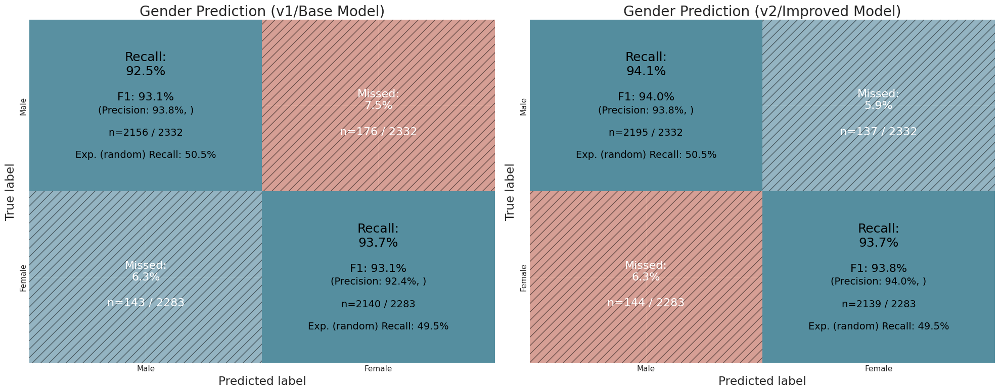

In [80]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

error_analysis.confusion_matrix_plot_v2(
    merged_data_base,
    "true_gender",
    "gender_pred",
    title="Gender Prediction (v1/Base Model)",
    class_labels=["Male", "Female"],
    ax=ax1,
)

error_analysis.confusion_matrix_plot_v2(
    merged_data_improved,
    "true_gender",
    "gender_pred",
    title="Gender Prediction (v2/Improved Model)",
    class_labels=["Male", "Female"],
    ax=ax2,
)

plt.tight_layout()
plt.show()

In [177]:
evaluation_results_improved[("gender_metrics")]

,Female,Male,Overall
Support,2353.000000,2387.000000,4740.000000
Accuracy,0.938608,0.938608,0.938608
Precision,0.939846,0.937396,0.938621
Recall,0.936252,0.940930,0.938591
F1-score,0.938046,0.939160,0.938603
AUC-ROC,NaN,NaN,0.981255
PR-AUC,NaN,NaN,0.976712
Log Loss,NaN,NaN,0.192300


##### Gender Accuracy By Age Group:

In [46]:
result_gender = pd.merge(
    evaluation_results_base["gender_accuracy_by_age"]["Accuracy"],
    evaluation_results_improved["gender_accuracy_by_age"]["Accuracy"],
    left_index=True,
    right_index=True,
    suffixes=("_v1", "_v2"),
)

result_gender["Improvement"] = (
    (result_gender["Accuracy_v2"] - result_gender["Accuracy_v1"])
    / result_gender["Accuracy_v1"]
    * 100
)
result_gender["Improvement"] = result_gender["Improvement"].map("{:+.2f}%".format)
result_gender

,Accuracy_v1,Accuracy_v2,Improvement
Age_Group,,,
0-4,0.6914,0.6892,-0.32%
4-14,0.8238,0.8467,+2.78%
14-24,0.9497,0.9670,+1.82%
24-30,0.9666,0.9674,+0.08%
30-40,0.9676,0.9780,+1.07%
40-50,0.9850,0.9875,+0.25%
50-60,0.9738,0.9786,+0.49%
60-70,0.9520,0.9738,+2.29%
70-80,0.9551,0.9551,+0.00%


##### Age Prediction Improvements By Age Group:

In [58]:
result_age = pd.merge(
    evaluation_results_base["performance_by_age_bin"][["Age_Group", "Age_MAE"]],
    evaluation_results_improved["performance_by_age_bin"][["Age_Group", "Age_MAE"]],
    on="Age_Group",
    suffixes=("_v1", "_v2"),
)

result_age["Improvement"] = (
    (result_age["Age_MAE_v1"] - result_age["Age_MAE_v2"])
    / result_age["Age_MAE_v1"]
    * 100
)
result_age["Improvement"] = result_age["Improvement"].map("{:+.2f}%".format)

result_age = result_age[["Age_Group", "Age_MAE_v1", "Age_MAE_v2", "Improvement"]]
result_age

,Age_Group,Age_MAE_v1,Age_MAE_v2,Improvement
0,0-4,1.588580,1.014360,+36.15%
1,4-14,4.011655,3.195415,+20.35%
2,14-24,4.171022,3.587664,+13.99%
3,24-30,3.720786,4.186014,-12.50%
4,30-40,6.270144,6.002176,+4.27%
5,40-50,7.749943,6.352205,+18.04%
6,50-60,7.311122,6.273703,+14.19%
7,60-70,6.725516,6.505069,+3.28%
8,70-80,7.617475,6.595112,+13.42%
9,80+,8.947648,8.218197,+8.15%


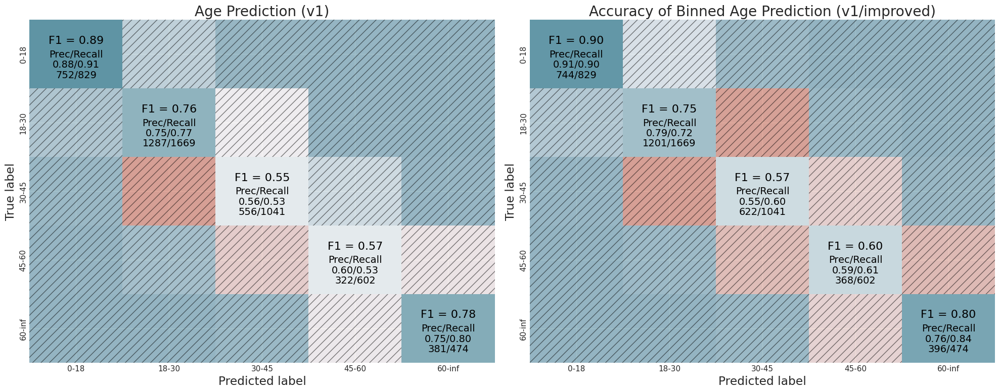

In [87]:
df_base, class_labels = process_age_groups(merged_data_base, "age_group", "age_pred")
df_improved, class_labels = process_age_groups(
    merged_data_improved, "age_group", "age_pred"
)

importlib.reload(error_analysis)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

importlib.reload(error_analysis)
error_analysis.confusion_matrix_plot_v3(
    df_base,
    "true_group_index",
    "pred_group_index",
    class_labels=class_labels,
    title="Age Prediction (v1)",
    ax=ax1,
    simplified=True,
)
error_analysis.confusion_matrix_plot_v3(
    df_improved,
    "true_group_index",
    "pred_group_index",
    class_labels=class_labels,
    title="Accuracy of Binned Age Prediction (v1/improved)",
    ax=ax2,
    simplified=True,
)
plt.tight_layout()
plt.show()

##### By Luminance Bin


In [68]:
result_gender_lum = pd.merge(
    lum_bins_base["gender"]["luminance_binned"]["accuracy"],
    lum_bins_improved["gender"]["luminance_binned"]["accuracy"],
    left_index=True,
    right_index=True,
    suffixes=("_v1", "_v2"),
)

result_gender_lum["Improvement"] = (
    (result_gender_lum["accuracy_v2"] - result_gender_lum["accuracy_v1"])
    / result_gender_lum["accuracy_v1"]
    * 100
)
result_gender_lum["Improvement"] = result_gender_lum["Improvement"].map(
    "{:+.2f}%".format
)

result_gender_lum = result_gender_lum.reset_index()
result_gender_lum.columns = [
    "Luminance_Bin",
    "Accuracy_v1",
    "Accuracy_v2",
    "Improvement",
]
result_gender_lum

,Luminance_Bin,Accuracy_v1,Accuracy_v2,Improvement
0,0-85,0.951,0.961,+1.05%
1,85-105,0.934,0.948,+1.50%
2,105-120,0.937,0.944,+0.75%
3,120-135,0.959,0.959,+0.00%
4,135-150,0.911,0.938,+2.96%
5,150+,0.904,0.899,-0.55%


In [70]:
result_age_lum = pd.merge(
    lum_bins_base["age"]["luminance_binned"]["MAE"],
    lum_bins_improved["age"]["luminance_binned"]["MAE"],
    left_index=True,
    right_index=True,
    suffixes=("_v1", "_v2"),
)

result_age_lum["Improvement"] = (
    (result_age_lum["MAE_v1"] - result_age_lum["MAE_v2"])
    / result_age_lum["MAE_v1"]
    * 100
)
result_age_lum["Improvement"] = result_age_lum["Improvement"].map("{:+.2f}%".format)

result_age_lum = result_age_lum.reset_index()
result_age_lum.columns = ["Luminance_Bin", "MAE_v1", "MAE_v2", "Improvement"]
result_age_lum

,Luminance_Bin,MAE_v1,MAE_v2,Improvement
0,0-85,5.408,5.231,+3.27%
1,85-105,5.407,5.169,+4.40%
2,105-120,4.997,4.818,+3.58%
3,120-135,5.616,4.899,+12.77%
4,135-150,5.037,4.694,+6.81%
5,150+,4.459,4.002,+10.25%


#### By Image Quality

In [71]:
result_gender_lum = pd.merge(
    lum_bins_base["gender"]["brisque_score_binned"]["accuracy"],
    lum_bins_improved["gender"]["brisque_score_binned"]["accuracy"],
    left_index=True,
    right_index=True,
    suffixes=("_v1", "_v2"),
)

result_gender_lum["Improvement"] = (
    (result_gender_lum["accuracy_v2"] - result_gender_lum["accuracy_v1"])
    / result_gender_lum["accuracy_v1"]
    * 100
)
result_gender_lum["Improvement"] = result_gender_lum["Improvement"].map(
    "{:+.2f}%".format
)

result_gender_lum = result_gender_lum.reset_index()
result_gender_lum.columns = ["BRISQUE_Bin", "Accuracy_v1", "Accuracy_v2", "Improvement"]
result_gender_lum

,BRISQUE_Bin,Accuracy_v1,Accuracy_v2,Improvement
0,-inf-25,0.938,0.943,+0.53%
1,25-35,0.933,0.942,+0.96%
2,35-45,0.930,0.945,+1.61%
3,45-55,0.926,0.926,+0.00%
4,55+,0.898,0.902,+0.45%


In [72]:
result_age_lum = pd.merge(
    lum_bins_base["age"]["brisque_score_binned"]["MAE"],
    lum_bins_improved["age"]["brisque_score_binned"]["MAE"],
    left_index=True,
    right_index=True,
    suffixes=("_v1", "_v2"),
)

result_age_lum["Improvement"] = (
    (result_age_lum["MAE_v1"] - result_age_lum["MAE_v2"])
    / result_age_lum["MAE_v1"]
    * 100
)
result_age_lum["Improvement"] = result_age_lum["Improvement"].map("{:+.2f}%".format)

result_age_lum = result_age_lum.reset_index()
result_age_lum.columns = ["BRISQUE_Bin", "MAE_v1", "MAE_v2", "Improvement"]
result_age_lum

,BRISQUE_Bin,MAE_v1,MAE_v2,Improvement
0,-inf-25,5.324,4.673,+12.23%
1,25-35,4.876,4.415,+9.45%
2,35-45,4.874,4.608,+5.46%
3,45-55,5.524,5.432,+1.67%
4,55+,5.899,6.080,-3.07%


#### 3.3.2. Individual Sample Analysis:

Let's look at the samples that were miss-classified using the initial model but are now correct in the new model:


In [ ]:
base_data_wrong_pred_df_good_on_improved = merged_data_base[
    ((merged_data_base["gender_pred"] > 0.5) & (merged_data_base["true_gender"] == 0))
    | (
        (merged_data_base["gender_pred"] <= 0.5)
        & (merged_data_base["true_gender"] == 1)
    )
]

base_data_wrong_pred_df_good_on_improved = pd.merge(
    base_data_wrong_pred_df_good_on_improved,
    merged_data_improved[["image_path", "true_gender", "gender_pred"]],
    on="image_path",
    how="left",
)

base_data_wrong_pred_df_good_on_improved = base_data_wrong_pred_df_good_on_improved[
    (
        (
            (base_data_wrong_pred_df_good_on_improved["true_gender_x"] == 0)
            & (base_data_wrong_pred_df_good_on_improved["gender_pred_x"] >= 0.5)
        )
        | (
            (base_data_wrong_pred_df_good_on_improved["true_gender_x"] == 1)
            & (base_data_wrong_pred_df_good_on_improved["gender_pred_x"] < 0.5)
        )
    )
    & (
        (
            (base_data_wrong_pred_df_good_on_improved["true_gender_y"] == 0)
            & (base_data_wrong_pred_df_good_on_improved["gender_pred_y"] < 0.5)
        )
        | (
            (base_data_wrong_pred_df_good_on_improved["true_gender_y"] == 1)
            & (base_data_wrong_pred_df_good_on_improved["gender_pred_y"] >= 0.5)
        )
    )
]
# Calculate error magnitude
base_data_wrong_pred_df_good_on_improved["base_error"] = abs(
    base_data_wrong_pred_df_good_on_improved["gender_pred_x"]
    - base_data_wrong_pred_df_good_on_improved["true_gender_x"]
)

N = 5
top_N_wrong = base_data_wrong_pred_df_good_on_improved.sort_values(
    "base_error", ascending=False
).head(N)
improved_image_files = top_N_wrong["image_path"]

merged_data_base["age_error"] = abs(
    merged_data_base["age_pred"] - merged_data_base["true_age"]
)
merged_data_improved["age_error"] = abs(
    merged_data_improved["age_pred"] - merged_data_improved["true_age"]
)

age_comparison = pd.merge(
    merged_data_base[["image_path", "true_age", "age_pred", "age_error"]],
    merged_data_improved[["image_path", "age_pred", "age_error"]],
    on="image_path",
    suffixes=("_base", "_improved"),
)

age_comparison["error_reduction"] = (
    age_comparison["age_error_base"] - age_comparison["age_error_improved"]
)

N = 5
top_N_age_improved = age_comparison.sort_values(
    "error_reduction", ascending=False
).head(N)
improved_age_image_files = top_N_age_improved["image_path"]

We've specifically selected the samples with which  the new version of model significantly improved:

In [165]:
results_gender_most_improved = [
    error_analysis.process_image_for_models(
        f"dataset/full/{img_file}", [base_model, improved_model]
    )
    for img_file in top_N_wrong["image_path"]
]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

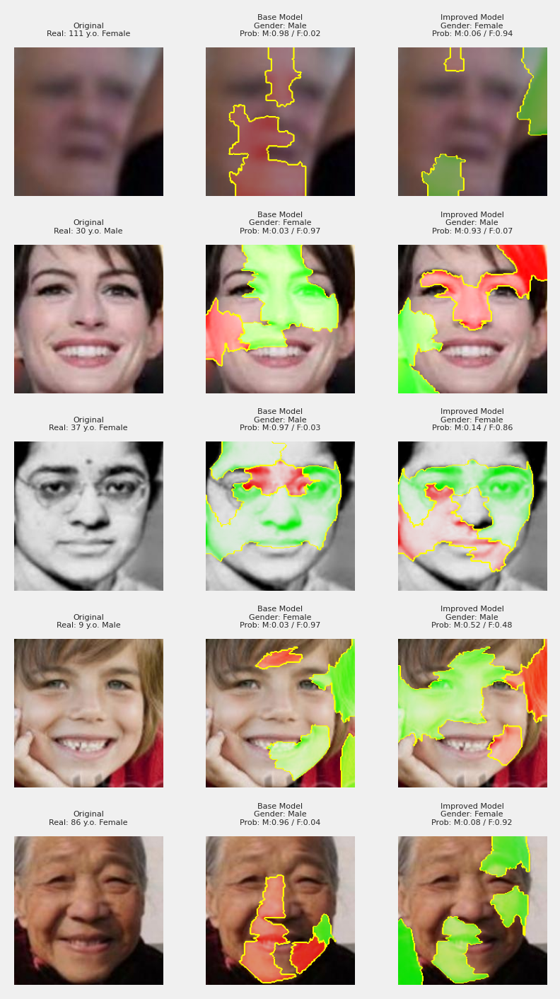

Figure size: 840x1400 px


In [166]:
importlib.reload(error_analysis)
error_analysis.display_grid_comparison(
    results_gender_most_improved,
    ["Base Model", "Improved Model"],
    comparison_type="gender",
)

Except from the second sample (which was presumably mislabeled in the dataset itself) the improvements seem pretty good. 

In [168]:
results_age_most_improved = [
    error_analysis.process_image_for_models(
        f"dataset/full/{img_file}", [base_model, improved_model]
    )
    for img_file in top_N_age_improved["image_path"]
]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

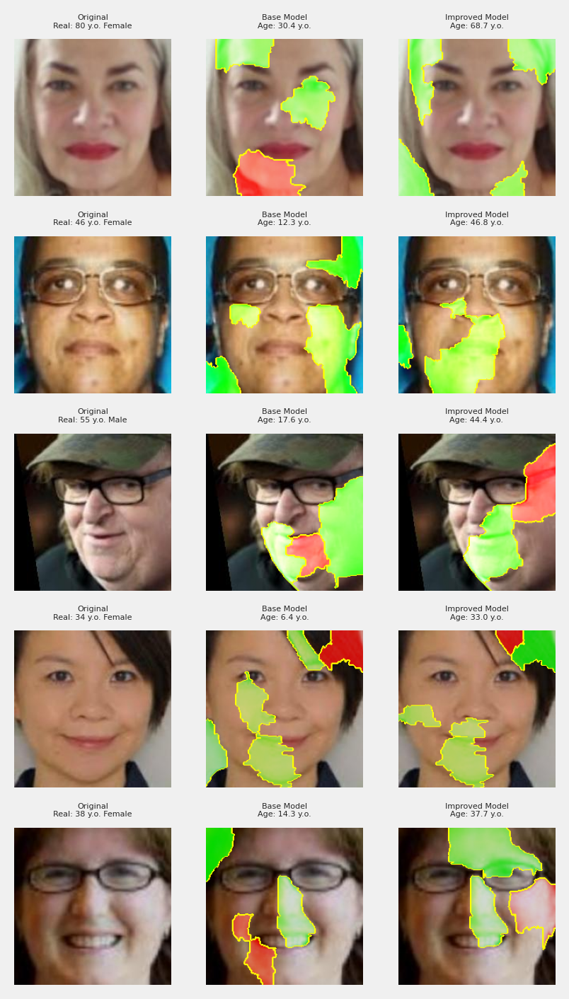

Figure size: 840x1400 px


In [170]:
importlib.reload(error_analysis)
error_analysis.display_grid_comparison(
    results_age_most_improved,
    ["Base Model", "Improved Model"],
    comparison_type="age",
)

In [158]:
#### Misclassified Age
base_worst_images_age = [
    "dataset/test_2_folds_last/111_1_0_20170120134646399.jpg.chip.jpg",
    "dataset/test_2_folds_last/9_0_0_20170110225030430.jpg.chip.jpg",
    "dataset/test_2_folds_last/41_1_1_20170117021604893.jpg.chip.jpg",
    "dataset/test_2_folds_last/8_0_1_20170114025855492.jpg.chip.jpg",
    "dataset/test_2_folds_last/80_1_0_20170110131953974.jpg.chip.jpg",
    "dataset/test_2_folds_last/15_0_0_20170116201332456.jpg.chip.jpg",
]

base_worst_images_gender = [
    "dataset/test_2_folds_last/26_1_1_20170116154712959.jpg.chip.jpg",
    "dataset/test_2_folds_last/111_1_0_20170120134646399.jpg.chip.jpg",
    "dataset/test_2_folds_last/9_0_0_20170110225030430.jpg.chip.jpg",
    "dataset/test_2_folds_last/8_0_1_20170114025855492.jpg.chip.jpg",
]

results_gender_worst_base = [
    error_analysis.process_image_for_models(f"{img_file}", [base_model, improved_model])
    for img_file in base_worst_images_gender
]

results_age_worst_base = [
    error_analysis.process_image_for_models(f"{img_file}", [base_model, improved_model])
    for img_file in base_worst_images_age
]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

Of course, we have specifically selected the best case examples (i.e. where the performance of model has improved the most) which probably gives a much too optimistic picture of the overall improvement (relative to increase in accuracy/MAE which is that significant).

Instead, we've selected some of the samples our initial model failed on that were unlikely to be mislabeled:

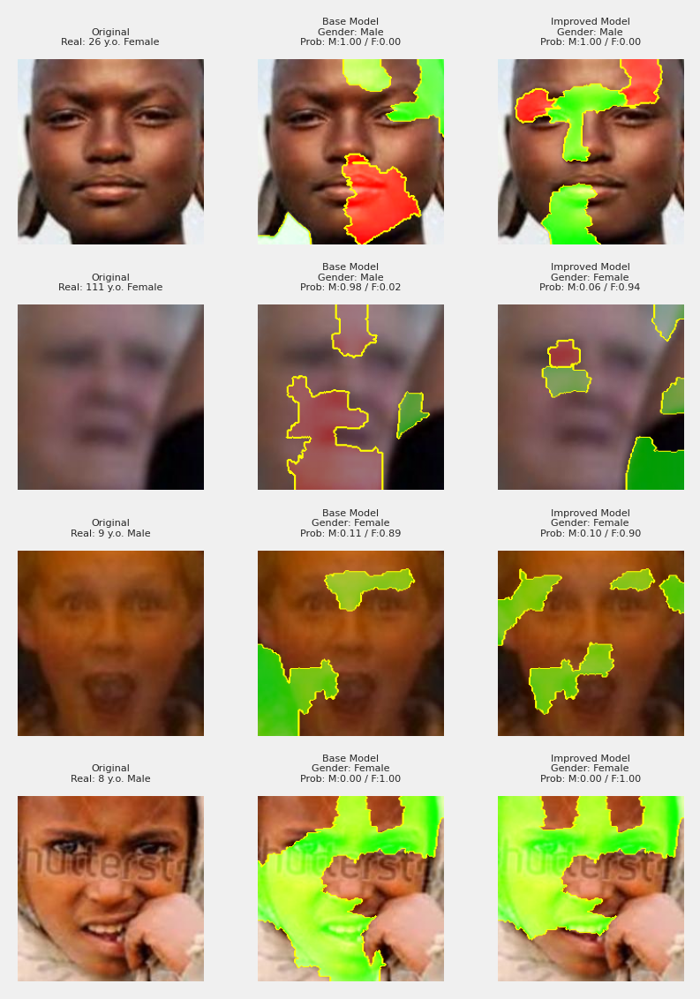

Figure size: 840x1120 px


In [159]:
importlib.reload(error_analysis)
error_analysis.display_grid_comparison(
    results_gender_worst_base,
    ["Base Model", "Improved Model"],
    comparison_type="gender",
)

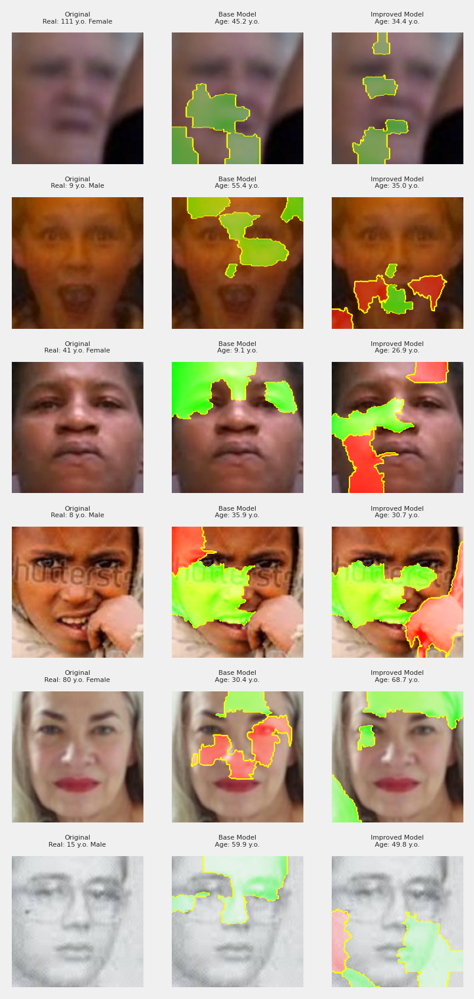

Figure size: 840x1680 px


In [160]:
importlib.reload(error_analysis)
error_analysis.display_grid_comparison(
    results_age_worst_base, ["Base Model", "Improved Model"], comparison_type="age"
)

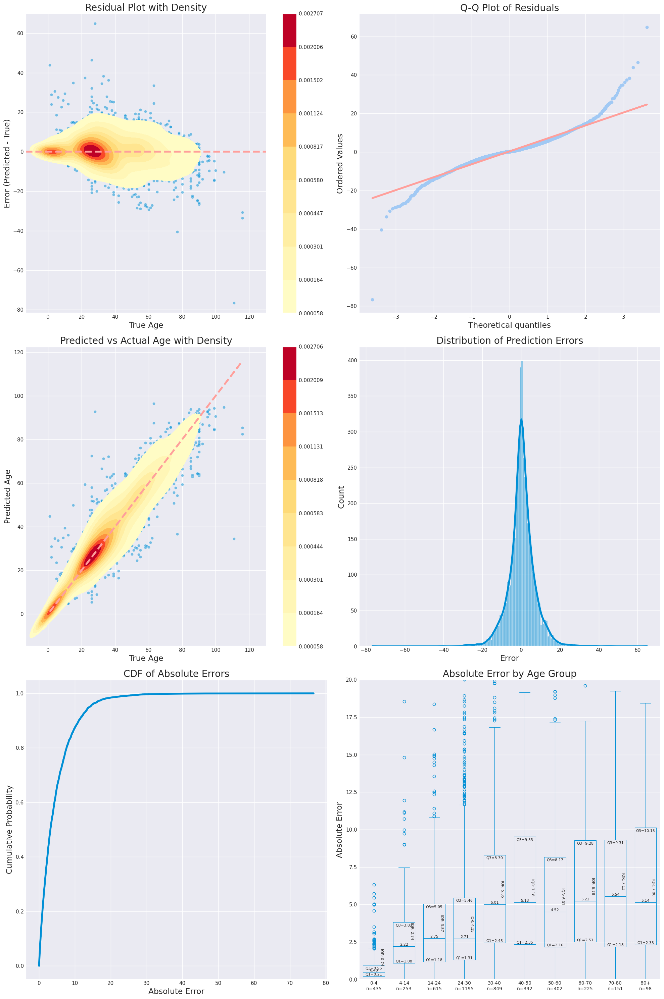

In [73]:
importlib.reload(error_analysis)
error_analysis.evaluate_age_prediction(
    merged_data_improved["true_age"],
    merged_data_improved["age_pred"],
    bins=metrics.DEFAULT_AGE_BINS,
)